# 🔗 MATA Graph System — Simple Pipelines

Build multi-step computer vision workflows using MATA's **graph system**.
Instead of calling one model at a time, chain nodes into a validated DAG
that MATA compiles, validates, and executes for you.

This notebook covers:
- **Node lists** — the simplest way to build a graph
- **Graph builder** — fluent `.then()` API
- **Pipe DSL** — `>>` operator for compact syntax
- **Filtering & TopK** — post-processing nodes
- **Fuse** — collecting results into a single `MultiResult`

**Prerequisites**: `pip install datamata[notebook]`

In [ ]:
# Uncomment to install if needed:
# !pip install datamata[notebook]
# !pip install timm

In [35]:
import mata
from pathlib import Path
print(f"MATA version: {mata.__version__}")

IMAGE_1   = "../../examples/images/000000039769.jpg"
IMAGE_2   = "../../examples/images/000000015338.jpg"

for label, p in [("image 1", IMAGE_1), ("image 2", IMAGE_2)]:
    status = "FOUND" if Path(p).exists() else "NOT FOUND"
    print(f"  {label:12s}: {status}")

MATA version: 1.9.4
  image 1     : FOUND
  image 2     : FOUND


## 1️⃣ Minimal Detection Pipeline (Node List)

The simplest graph is a **list of nodes** passed to `mata.infer()`.
Each node declares its inputs/outputs — MATA wires them together automatically.

In [36]:
from mata.nodes import Detect, Filter, Fuse

# Load a detector
detector = mata.load("detect", "facebook/detr-resnet-50")

# Build & run: node list style
result = mata.infer(
    image=IMAGE_1,
    graph=[
        Detect(using="detector", out="dets"),
        Filter(src="dets", score_gt=0.5, out="filtered"),
        Fuse(dets="filtered", out="final"),
    ],
    providers={"detector": detector},
)

#print(f"Detected {len(result.final.instances)} objects (score > 0.5)")
result.final.dets.instances

[INFO] Loading detect model from huggingface: facebook/detr-resnet-50
[INFO] Auto-selected CUDA device (NVIDIA GeForce RTX 3070)
[INFO] Initialized HuggingFaceDetectAdapter with device=cuda, threshold=0.3
[INFO] Loading HuggingFace model: facebook/detr-resnet-50
[INFO] Detected architecture: detr
[INFO] Model loaded successfully on cuda
[INFO] Starting synchronous execution of graph 'untitled_graph'
[INFO] Graph 'untitled_graph' completed in 274.60ms (3 nodes)


[Instance(score=0.998219907283783, label=75, bbox=(40.16227340698242, 70.80741882324219, 175.54830932617188, 117.98204040527344), mask=None, label_name='remote', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None),
 Instance(score=0.996005117893219, label=75, bbox=(333.2471008300781, 72.55055236816406, 368.32958984375, 187.6637725830078), mask=None, label_name='remote', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None),
 Instance(score=0.9954837560653687, label=63, bbox=(-0.022182464599609375, 1.1494159698486328, 639.7268676757812, 473.76220703125), mask=None, label_name='couch', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None),
 Instance(score=0.99880051612854, label=17, bbox=(13.244609832763672, 52.04668426513672, 314.015869140625, 470.93463134765625), mask=None, label_name='cat', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None),
 Instance(score=0.9986791014671326, label=17, bbox=(345.40280151

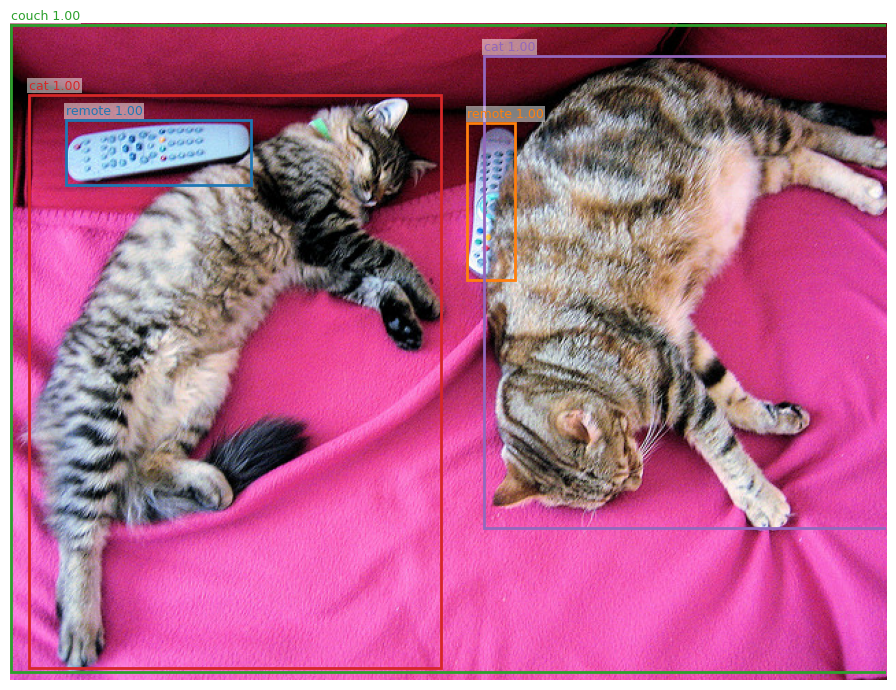

In [37]:

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def show_detections(img, dets):
    fig, ax = plt.subplots(1, figsize=(10, 7))
    ax.imshow(img)

    colors = plt.cm.tab10.colors
    for i, inst in enumerate(dets.instances):
        x1, y1, x2, y2 = inst.bbox
        color = colors[i % len(colors)]
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                linewidth=2, edgecolor=color, facecolor="none")
        ax.add_patch(rect)
        label = f"{inst.label_name} {inst.score:.2f}"
        ax.text(x1, y1 - 4, label, color=color, fontsize=9,
                bbox=dict(facecolor="white", alpha=0.5, pad=1, edgecolor="none"))

    ax.axis("off")
    plt.tight_layout()
    plt.show()

# Show detections on the image
img = Image.open(IMAGE_1)
dets = result.final.dets
show_detections(img, dets)

## 2️⃣ Graph Builder — Fluent `.then()` API

The `Graph` builder lets you name your pipeline and chain nodes with `.then()`.
The compiled graph is reusable — run it on multiple images.

In [38]:
from mata.core.graph import Graph
from mata.nodes import Detect, Filter, TopK, Fuse

# Build a reusable graph
graph = (
    Graph("top5_detections")
    .then(Detect(using="detector", out="dets"))
    .then(Filter(src="dets", score_gt=0.3, out="filtered"))
    .then(TopK(k=5, src="filtered", out="top5"))
    .then(Fuse(dets="top5", out="final"))
)

# Run on an image
result = mata.infer(
    IMAGE_1,
    graph,
    providers={"detector": detector},
)

for inst in result.final["dets"].instances:
    print(f"  {inst.label_name}: {inst.score:.2f} at {inst.bbox}")

[INFO] Starting synchronous execution of graph 'top5_detections'
[INFO] Graph 'top5_detections' completed in 312.20ms (4 nodes)
  cat: 1.00 at (13.244609832763672, 52.04668426513672, 314.015869140625, 470.93463134765625)
  cat: 1.00 at (345.4028015136719, 23.860057830810547, 640.37158203125, 368.7209167480469)
  remote: 1.00 at (40.16227340698242, 70.80741882324219, 175.54830932617188, 117.98204040527344)
  remote: 1.00 at (333.2471008300781, 72.55055236816406, 368.32958984375, 187.6637725830078)
  couch: 1.00 at (-0.022182464599609375, 1.1494159698486328, 639.7268676757812, 473.76220703125)


## 3️⃣ Graph.run() — Build & Execute in One Expression

`Graph.run()` delegates to `mata.infer()` internally.
Build the graph once, then call `.run()` on different images.

[INFO] Starting synchronous execution of graph 'reusable_pipeline'
[INFO] Graph 'reusable_pipeline' completed in 286.91ms (3 nodes)
Image 1: 5 objects


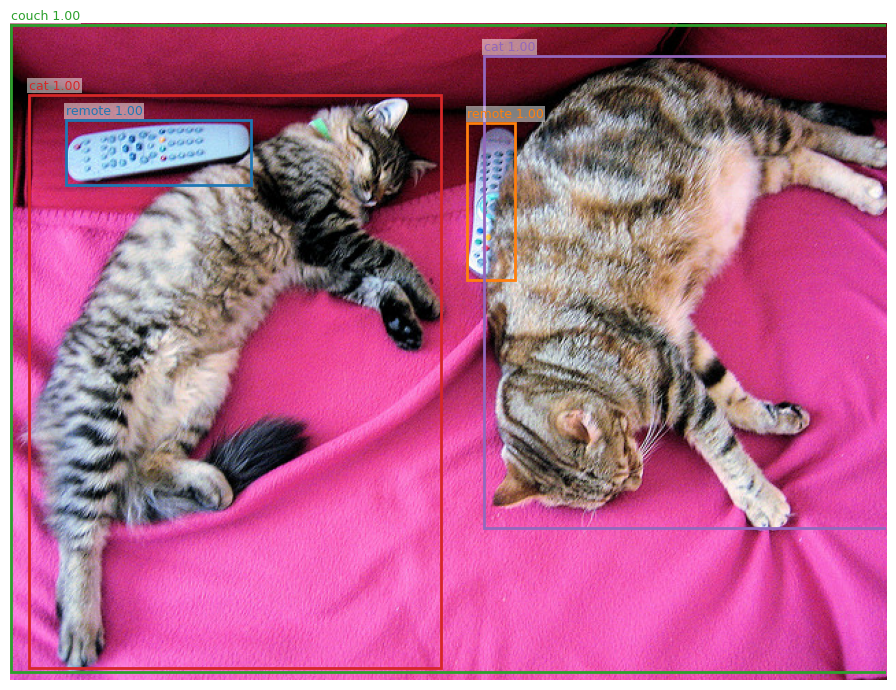

[INFO] Starting synchronous execution of graph 'reusable_pipeline'
[INFO] Graph 'reusable_pipeline' completed in 78.13ms (3 nodes)
Image 2: 6 objects


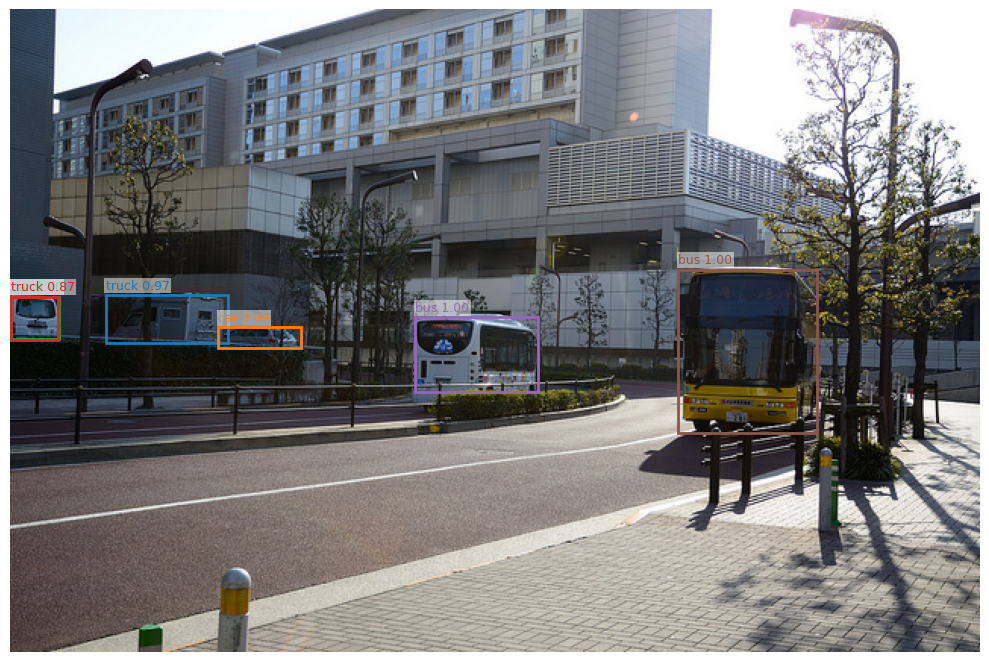

In [40]:
from mata.core.graph import Graph
from mata.nodes import Detect, Filter, Fuse

graph = (
    Graph("reusable_pipeline")
    .then(Detect(using="detector", out="dets"))
    .then(Filter(src="dets", score_gt=0.5, out="filtered"))
    .then(Fuse(dets="filtered", out="final"))
)

# Run on first image
result1 = graph.run(
    IMAGE_1,
    providers={"detector": detector},
)
print(f"Image 1: {len(result1.final.dets.instances)} objects")

img = Image.open(IMAGE_1)
show_detections(img, result1.final.dets)

# Same graph, different image
result2 = graph.run(
    IMAGE_2,
    providers={"detector": detector},
)
print(f"Image 2: {len(result2.final.dets.instances)} objects")

img = Image.open(IMAGE_2)
show_detections(img, result2.final.dets)

## 4️⃣ Pipe DSL — `>>` Operator

For the most compact syntax, use `NodePipe` with the `>>` operator.

In [42]:
from mata.core.graph.dsl import NodePipe
from mata.nodes import Detect, Filter, Fuse

graph = (
    NodePipe(Detect(using="detector", out="dets"))
    >> Filter(src="dets", score_gt=0.5, out="filtered")
    >> Fuse(dets="filtered", out="final")
).build(name="pipe_graph")

result = mata.infer(
    IMAGE_1,
    graph,
    providers={"detector": detector},
)

print(f"Pipe result: {len(result.final.dets.instances)} objects")
result.final

[INFO] Starting synchronous execution of graph 'pipe_graph'
[INFO] Graph 'pipe_graph' completed in 245.39ms (3 nodes)
Pipe result: 5 objects


MultiResult(channels=[dets], provenance=7 keys, metrics=2 keys)

## 5️⃣ Detection → SAM Segmentation

Use detection bounding boxes as prompts for SAM — a two-model pipeline.

[INFO] Loading segment model from huggingface: facebook/sam-vit-base
[INFO] Auto-selected CUDA device (NVIDIA GeForce RTX 3070)
[INFO] Initialized HuggingFaceSAMAdapter with device=cuda, threshold=0.0
[INFO] Loading SAM model: facebook/sam-vit-base
[INFO] Loaded SAM model on cuda (zero-shot mode, RLE=True)
[INFO] Starting synchronous execution of graph 'untitled_graph'
[INFO] Running SAM on 640x480 image (boxes=5)
[INFO] Generated 15 masks (threshold=0.00)
[INFO] Graph 'untitled_graph' completed in 307.91ms (4 nodes)


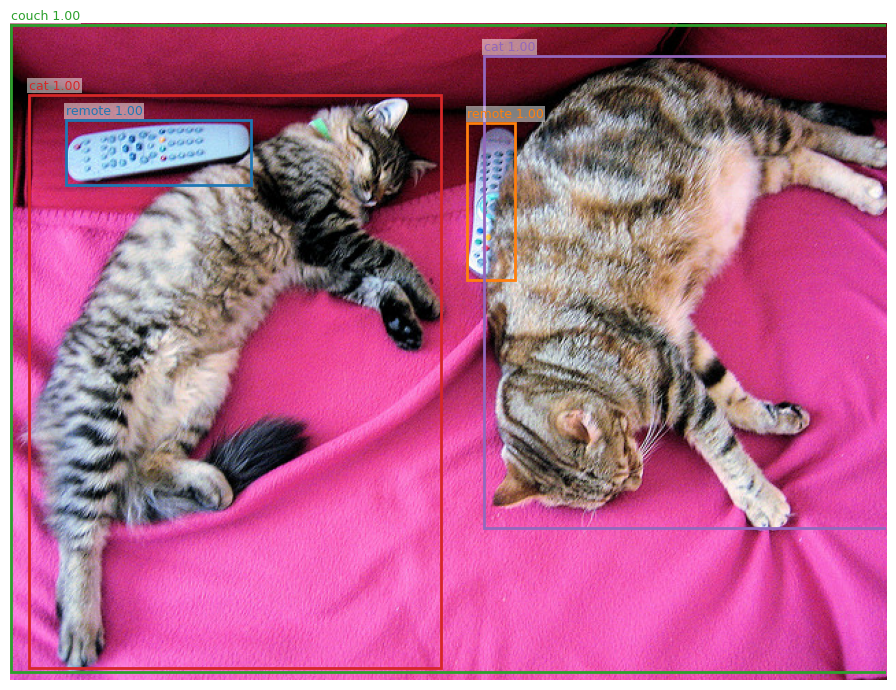

Detections(instances=[Instance(score=0.998219907283783, label=75, bbox=(40.16227340698242, 70.80741882324219, 175.54830932617188, 117.98204040527344), mask=None, label_name='remote', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.996005117893219, label=75, bbox=(333.2471008300781, 72.55055236816406, 368.32958984375, 187.6637725830078), mask=None, label_name='remote', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.9954837560653687, label=63, bbox=(-0.022182464599609375, 1.1494159698486328, 639.7268676757812, 473.76220703125), mask=None, label_name='couch', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.99880051612854, label=17, bbox=(13.244609832763672, 52.04668426513672, 314.015869140625, 470.93463134765625), mask=None, label_name='cat', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.9986791014671326, label=17, b

Masks(instances=[Instance(score=0.99732905626297, label=0, bbox=(347.0, 19.0, 639.0, 277.0), mask={'size': [480, 640], 'counts': '[iR5=c>000Hi0_O0^Og0]EXNd7h1\\HXNd7h1\\HXNU7a2gFnMa0Eh8]2gFnMa0E`8j2dFoMb0YOj8h2dFoMb0YOj8h2dFoMb0YOf8_4kFeKU9[4kFeKQ9W50000O100L31000J600N02000N200M30000N200N20000L6N0N3O000N200O10000N200N20000N200N20000N200N20000N4N0000000O100N20000N200000000N200000000N0200000000O100N2000N0200000000N20N2000000000000000N200TO]HYJe7g5[HYJe7g5[HYJd7d5XHjI4=i7i5SHjI4=i7i5YHmIS8S6mGmIS8S6mGmIQ8U6iGlI\\8T6dGlI\\8Z620000JbGhI`8X6`GhI`8X64000N0200000002N0000000002N020N00002N002N00002N00gMiGkMU8U2kGkMU8U2kGkMV8P2PHoMo7Q2QHoMo7o1UHQNi7o1WHQNi7o1WHQNk7g1^HXN`7h1`HXN`7e1eH[NY7e1gH[NY7e1gH[NY7a1mHaNo6_1QIaNQ7]1QIcNm6]1SIcNm6]1SIcNo6Y1WIeNg6[1YIeNi6W1]IhN`6X1`IhN`6X1`IhN`6T1dIPOX6P1hIPOX6P1kIoNS6Q1mIoNS6Q1mIoNU6l0nIXOn5h0RJXOn5d0ZJPNmM=f7c1]JPNmM=f7c1]JPNmM=h7_1_JRNmM=b7a1aJRNmM=b7]1gJVNgM;b7_1gJVNgM;b7_1gJVNgM;c7W1QKZN_M>^7X1SKZN_M>`7n0YKdNYM`0Z7l0]KdNYM`0Z7l0]KdNYM`0Z7j0`KgNVM?X7j0bKg

In [57]:
from mata.nodes import Detect, Filter, PromptBoxes, Fuse

segmenter = mata.load("segment", "facebook/sam-vit-base")

result = mata.infer(
    image=IMAGE_1,
    graph=[
        Detect(using="detector", out="dets"),
        Filter(src="dets", score_gt=0.5, out="filtered"),
        PromptBoxes(using="segmenter", dets_src="filtered", out="masks"),
        Fuse(dets="filtered", masks="masks", out="final"),
    ],
    providers={"detector": detector, "segmenter": segmenter},
)

img = Image.open(IMAGE_1)
show_detections(img, result.final.dets)
print(result.final.dets)

print(f"Segmented {len(result.final.masks.instances)} objects")
result.final.masks


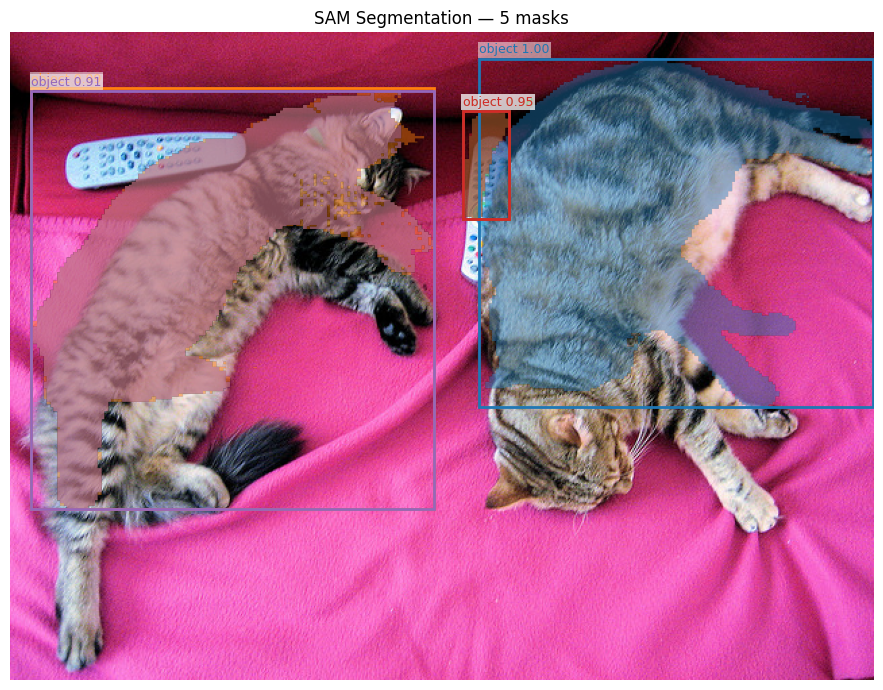

In [58]:

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from PIL import Image

img = np.array(Image.open(IMAGE_1).convert("RGB"))
masks_artifact = result.final.masks
binary_masks = masks_artifact.to_binary()   # list of (H, W) bool arrays

fig, ax = plt.subplots(1, figsize=(10, 7))
ax.imshow(img)

colors = plt.cm.tab10.colors
for i, (inst, mask) in enumerate(zip(masks_artifact.instances, binary_masks)):
    color = colors[i % len(colors)]

    # Overlay semi-transparent mask
    overlay = np.zeros((*img.shape[:2], 4), dtype=float)
    overlay[mask] = (*color[:3], 0.45)
    ax.imshow(overlay)

    # Bounding box
    if inst.bbox is not None:
        x1, y1, x2, y2 = inst.bbox
        rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1,
                                  linewidth=2, edgecolor=color, facecolor="none")
        ax.add_patch(rect)
        label = f"{inst.label_name} {inst.score:.2f}" if inst.score else inst.label_name
        ax.text(x1, y1 - 4, label, color=color, fontsize=9,
                bbox=dict(facecolor="white", alpha=0.5, pad=1, edgecolor="none"))

ax.axis("off")
plt.title(f"SAM Segmentation — {len(binary_masks)} masks")
plt.tight_layout()
plt.show()


## 6️⃣ Zero-Shot Detection with GroundingDINO

Detect objects by **text description** — no predefined class labels needed.

In [60]:
from mata.nodes import Detect, Filter, Fuse

grounding_dino = mata.load("detect", "IDEA-Research/grounding-dino-tiny")

result = mata.infer(
    image=IMAGE_1,
    graph=[
        Detect(using="grounding_dino", text_prompts="cat . remote . couch", out="dets"),
        Filter(src="dets", score_gt=0.3, out="filtered"),
        Fuse(dets="filtered", out="final"),
    ],
    providers={"grounding_dino": grounding_dino},
)

for inst in result.final.dets.instances:
    print(f"  {inst.label_name}: {inst.score:.2f}")

[INFO] Loading detect model from huggingface: IDEA-Research/grounding-dino-tiny
[INFO] Auto-selected CUDA device (NVIDIA GeForce RTX 3070)
[INFO] Initialized HuggingFaceZeroShotDetectAdapter with device=cuda, threshold=0.3
[INFO] Detected zero-shot architecture: grounding_dino
[INFO] Loading GroundingDINO model: IDEA-Research/grounding-dino-tiny
[INFO] Successfully loaded grounding_dino on cuda
[INFO] Starting synchronous execution of graph 'untitled_graph'
[INFO] Graph 'untitled_graph' completed in 551.18ms (3 nodes)
  cat: 0.88
  remote: 0.75
  cat: 0.86
  remote: 0.66


d:\Documents\OneDrive\Code\mtp\datamata_io\mata\.venv\Lib\site-packages\transformers\models\grounding_dino\processing_grounding_dino.py:91: FutureWarning: The key `labels` is will return integer ids in `GroundingDinoProcessor.post_process_grounded_object_detection` output since v4.51.0. Use `text_labels` instead to retrieve string object names.
  warnings.warn(self.message, FutureWarning)


## 7️⃣ Extract Object Crops (ROIs)

Crop detected objects for per-region analysis or saving.

[INFO] Starting synchronous execution of graph 'untitled_graph'
[INFO] Graph 'untitled_graph' completed in 117.56ms (4 nodes)


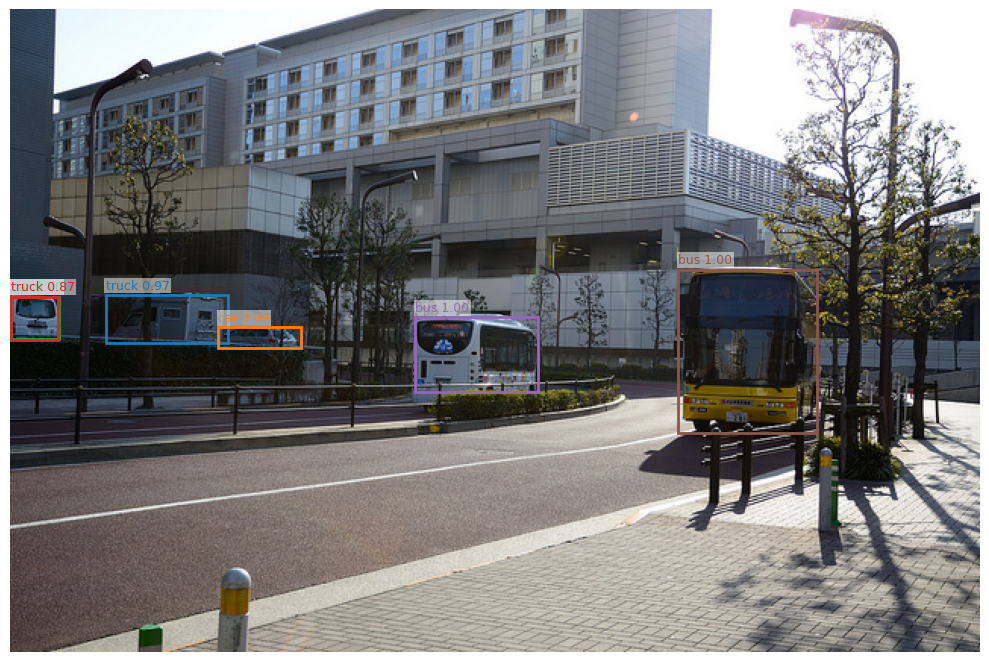

Detections(instances=[Instance(score=0.9680184721946716, label=8, bbox=(62.69355010986328, 187.93931579589844, 143.20010375976562, 219.3764190673828), mask=None, label_name='truck', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.9881388545036316, label=3, bbox=(136.93109130859375, 209.2683868408203, 191.20240783691406, 222.91981506347656), mask=None, label_name='car', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.6997110247612, label=3, bbox=(-0.004391670227050781, 189.0389404296875, 32.008888244628906, 216.90724182128906), mask=None, label_name='car', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.8660570979118347, label=8, bbox=(-0.042084455490112305, 189.0889129638672, 31.407752990722656, 217.5979766845703), mask=None, label_name='truck', area=None, is_stuff=None, embedding=None, track_id=None, keypoints=None), Instance(score=0.9988918900489807, label=

In [79]:
from mata.nodes import Detect, Filter, ExtractROIs, Fuse

result = mata.infer(
    image=IMAGE_2,
    graph=[
        Detect(using="detector", out="dets"),
        Filter(src="dets", score_gt=0.5, out="filtered"),
        ExtractROIs(src_dets="filtered", padding=15, out="rois"),
        Fuse(dets="filtered", rois="rois", out="final"),
    ],
    providers={"detector": detector},
)

img = Image.open(IMAGE_2)
show_detections(img, result.final.dets)
print(result.final.dets)

print(result.final.rois.roi_images)
print(result.final.dets.instance_ids)

for roi, inst_id in zip(result.final.rois.roi_images, result.final.dets.instance_ids):
    print(f"  Crop for instance {inst_id}: {roi.size}")



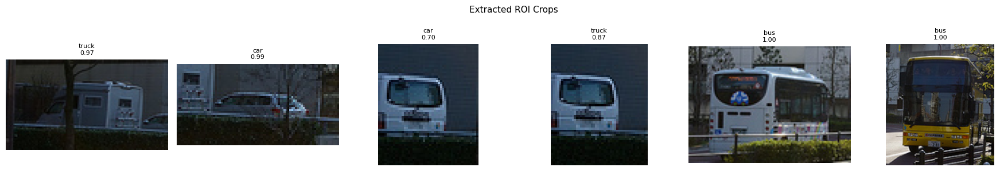

In [ ]:

import matplotlib.pyplot as plt

rois_artifact = result.final.rois
dets = result.final.dets

n = len(rois_artifact.roi_images)
fig, axes = plt.subplots(1, n, figsize=(3 * n, 3))
if n == 1:
    axes = [axes]

for ax, roi, inst_id, inst in zip(axes, rois_artifact.roi_images, rois_artifact.instance_ids, dets.instances):
    ax.imshow(roi)
    ax.set_title(f"{inst.label_name}\n{inst.score:.2f}", fontsize=8)
    ax.axis("off")

plt.suptitle("Extracted ROI Crops (Padded)", fontsize=11)
plt.tight_layout()
plt.show()


## Summary

| Pattern | When to use |
|---------|-------------|
| **Node list** | Quick one-off pipelines |
| **Graph builder** `.then()` | Named, reusable pipelines |
| **Graph.run()** | Build-and-run in a single expression |
| **Pipe DSL** `>>` | Compact inline pipelines |

All styles produce the same result — pick the one that fits your workflow.

**Next**: [Advanced Graph Pipelines →](11_graph_advanced.ipynb)